<a href="https://colab.research.google.com/github/FaragoFa/PDI/blob/main/PDI_Practica_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ACTIVIDAD PRACTICA 6

# Faragó Facundo - 114462

# Cargar repositorio

In [2]:
! git clone https://github.com/FaragoFa/PDI.git

Cloning into 'PDI'...
remote: Enumerating objects: 44, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 44 (delta 15), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (44/44), done.


# Importar librerias e Imagenes

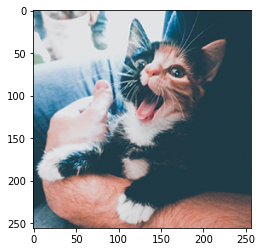

In [3]:
import imageio      #Para leer y guardar imagenes.
import numpy as np  #Operaciones con vectores, matrices, tensores...
import matplotlib.pyplot as plt    #Para realizar graficos.
import matplotlib.image as plti    #Para guardar imagenes.
from skimage.feature import canny

%matplotlib inline

#Cargo imagen
img = imageio.imread('/content/PDI/Tizona256.jpg')/255
plt.imshow(img)

# Funciónes

## Histograma

In [4]:
def plot_hist(im, bins, ax, cumulative=False):
    counts, borders = np.histogram(im if im.ndim==2 else rgb2yiq(im)[...,0], bins=bins, range=(0,1))
    ax.bar(range(len(counts)), np.cumsum(counts) if cumulative else counts)
    plt.xticks(ax.get_xticks(), labels=np.round(ax.get_xticks()/bins,2))
    plt.grid(alpha=0.3)

## Error medio cuadratico

In [5]:
def rmse(img1, img2):
    return np.sqrt(np.mean((img1-img2)**2))

## Operaciones con matrices

In [6]:
def apply_matrix(img, M):
        return np.matmul(img.reshape((-1,3)), M.T).reshape(img.shape)

### RGB - YIQ

In [7]:
M_YIQ = np.array([[0.299, 0.587, 0.114],
                  [0.595716, -0.274453, -0.321263],
                  [0.211456, -0.522591, 0.311135]])

M_RGB = np.array([[1, 0.9563, 0.6210],
                  [1, -0.2721, -0.6474],
                  [1, -1.1070, 1.7046]])

def apply_matrix(img, M):
    return np.matmul(img.reshape((-1,3)), M.T).reshape(img.shape)

def rgb2yiq(img):
    return apply_matrix(img, M_YIQ)

def yiq2rgb(img):
    return apply_matrix(img, M_RGB)

### Matriz Gaussiana

In [8]:
import scipy.stats as st #Para hacer el filtro Gaussiano

def gaussian(N, sigma=1):
    x = np.linspace(-sigma, sigma, N+1) #linspace crea un vector de valores entre -sigma y sigma igualmente distribuidos
    gaussian_dist = np.diff(st.norm.cdf(x)) #CDF = Cumulative distribution function NORM: distribucion normal/gaussiana.
    gaussian_filter = np.outer(gaussian_dist, gaussian_dist)
    return gaussian_filter/gaussian_filter.sum()

## Operaciones con Kernels

### Graficar el Kernel en 3D

In [9]:
def plot_kernel(data, ax=None):
    rows, cols = data.shape
    y, x = np.meshgrid(np.arange(rows),np.arange(cols),indexing='ij')
    if ax == None:
        fig = plt.figure()
        ax = fig.gca(projection='3d')
    _min, _max = (np.min(data), np.max(data))
    ax.plot_surface(x, y, data.T, cmap=cm.jet, vmin=_min, vmax=_max)

### Graficar imagen, imagen filtrada y kernel en un solo grafico.

In [10]:
def plot_images_and_kernel(img, img_filt, kernel):
    fig = plt.figure(figsize=(17,5))
    ax1 = fig.add_subplot(131)
    ax1.imshow(img, 'gray')
    ax1.title.set_text('Input image')
    ax2 = fig.add_subplot(132)
    ax2.imshow(img_filt, 'gray')
    ax2.title.set_text('Filtered image')
    ax3 = fig.add_subplot(133, projection='3d')
    plot_kernel(kernel, ax=ax3)
    ax3.title.set_text('Kernel')
    plt.show()

## Operaciones morfologicas

In [11]:
def morph_op(img, se, fcn): 
    '''Implements a general morphologic operation.'''
    se_flip = np.flip(se, axis=[0,1])
    rk, ck = se_flip.shape
    img_pad = np.pad(img, ((rk//2, rk//2), (ck//2, ck//2)), 'edge')
    img_out = np.zeros(img.shape)
    for r,c in np.ndindex(img.shape):
        img_out[r,c] = fcn(img_pad[r:r+rk,c:c+ck][se_flip])
    return img_out

### Operacion morfologica de multibanda

In [12]:

def morph_multiband(img, se, argfcn):
    '''Implements a general morphologic operation on a mutichannel image based on the first channel.'''
    se_flip = np.flip(se, axis=[0,1])
    rk, ck = se_flip.shape
    img_pad = np.pad(img, ((rk//2, rk//2), (ck//2, ck//2), (0,0)), 'edge')
    img_out = np.zeros(img.shape)
    rse, cse = np.where(se_flip)
    for r,c in np.ndindex(img.shape[:2]):
        loc = argfcn(img_pad[r:r+rk,c:c+ck,0][se_flip])
        img_out[r,c] = img_pad[r+rse[loc],c+cse[loc]]
    return img_out

### Operacion morfologica de color

In [13]:
def morph_color(img, se, argfcn):
    '''Applies a morphological operation to a color image based on the 
    Y-channel.
    '''
    img2 = (rgb2yiq(img)[:, :, 0])[:, :, np.newaxis]
    img2 = np.concatenate((img2, img),axis=2)
    result = morph_multiband(img2, se, argfcn)[:, :, 1:]
    return result

### Dilatacion

In [14]:
def im_dilate(img, se):
    '''Morphological dilation for binary, grayscale or RGB images.'''
    if img.ndim == 2:
        return morph_op(img, se, np.max)
    else:
        return morph_color(img, se, np.argmax)  

### Erosion

In [15]:
def im_erosion(img, se):
    '''Morphological erosion for binary, grayscale or RGB images.'''
    if img.ndim == 2:
        return morph_op(img, se, np.min)
    else:
        return morph_color(img, se, np.argmin) 

### Mediana

In [16]:
def mediana(M, L):
    x = np.argsort(M)
    L = int(L/2) 
    return x[L]

def im_mediana(img, se):
    '''Morphological dilation for binary, grayscale or RGB images.'''
    if img.ndim == 2:
        return morph_op(img, se, np.median)
    else:
        return morph_color(img, se, mediana(se, len(se)))

### Borde Externo

In [17]:
def im_borde_externo(img, se):
    return im_dilate(img,se) - img

### Borde Interno

In [18]:
def im_borde_interno(img, se):
    return img - im_erosion(img,se)

### Gradiente

In [19]:
def im_gradiente(img, se):
    return im_dilate(img,se) - im_erosion(img,se)

### Apertura

In [20]:
def im_apertura(img, se):
    x = im_erosion(img,se)
    x = im_dilate(x,se)
    return x

### Cierre

In [21]:
def im_cierre(img, se):
    x = im_dilate(img,se)
    u = im_erosion(x,se)    
    return u

### Top-Hat

In [22]:
def im_tophat(img, se):
    return img - im_apertura(img,se)

### Bottom-Hat

In [23]:
def im_bottomhat(img, se):
    return im_cierre(img,se) - img

### OC

In [24]:
def im_oc(img, se):
    x = im_apertura(img,se)
    x = im_cierre(x,se)    
    return x

### CO

In [25]:
def im_co(img, se):
    x = im_cierre(img,se)
    x = im_apertura(x,se)    
    return x

# Practica: Operaciones morfológicas

Definir los siguientes elementos estructurantes (structuring elements), para luego aplicar operaciones morfológicas. 
Los elementos estructurantes son similares a un kernel convolucional pero el tipo de dato es booleano (True o False). 

1. Box
2. Circle

Utilizando las funciones de ejemplo implementar las siguientes operaciones morfológicas, tanto para escala de grises como para RGB. Para RGB realizar la operación en base a los valores del canal Y:

Operaciones básicas (nivel 1):

1. Dilatación
2. Erosión
3. Filtro de mediana

Operaciones de suma/resta entre erosión y dilatación:

4. Borde externo (Dilatacion - imagen)
5. Borde interno (imagen - Erosión)
6. Gradiente (Dilatación - Erosión)

Operaciones concatenando dilatación y erosión (nivel 2):

7. Apertura (Erosión + Dilatación)
8. Cierre (Dilatación + Erosión)
9. Top-hat (imagen - Apertura)
10. Bottom-hat (Cierre - imagen)

Operaciones concatenando cierre y apertura (nivel 3):

11. OC (Open + Close)
12. CO (Close + Open)

EXTRA:

13. Segmentación del iris del ojo
14. Extracción de texto

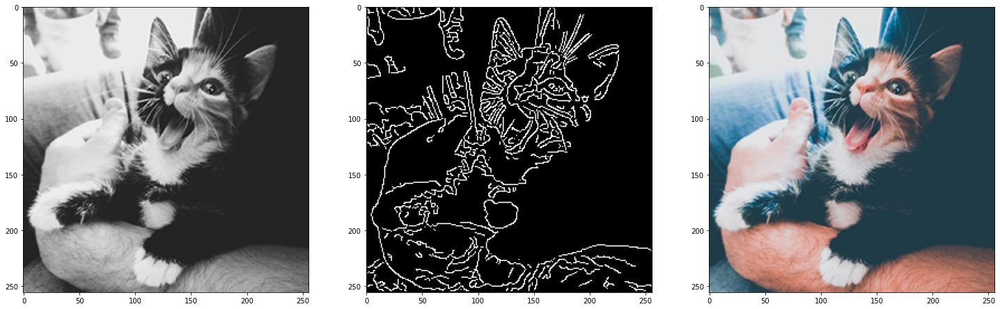

In [26]:
img_rgb = img
img_gray = rgb2yiq(img)[:,:,0]
img_bin = canny(img_gray, sigma = 1)

fig, axes = plt.subplots(1, 3, figsize=(25,30))
axes[0].imshow(img_gray, 'gray')
axes[1].imshow(img_bin, 'gray')
axes[2].imshow(img_rgb)

## BOX y CIRCLE

In [27]:
N=3
se_box = np.ones((N,N), dtype=bool)
print(se_box)



se_circle = np.array([[0,1,0],
                      [1,1,1],
                      [0,1,0]])

se_circle = se_circle > 0
print()
print(se_circle)




[[ True  True  True]
 [ True  True  True]
 [ True  True  True]]

[[False  True False]
 [ True  True  True]
 [False  True False]]


## Operaciones básicas

### DILATACION

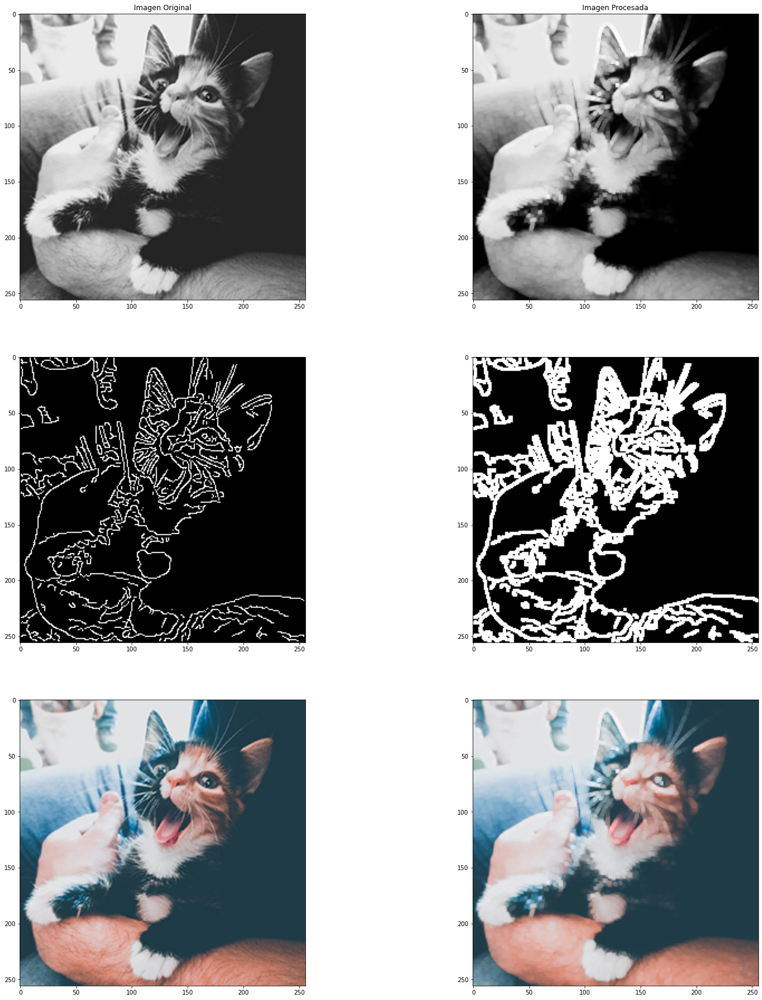

In [28]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_dilate(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_dilate(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_dilate(img_rgb,se))

### Erosion

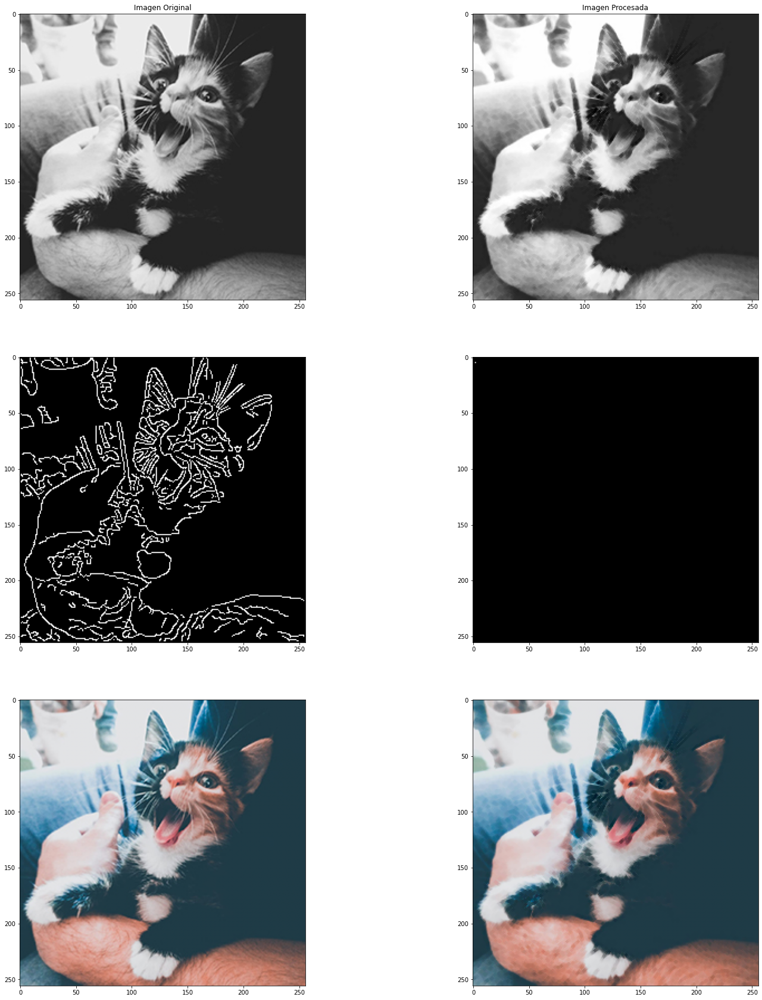

In [29]:
se = se_circle

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_erosion(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_erosion(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_erosion(img_rgb,se))

### Filtro de mediana

TypeError: ignored

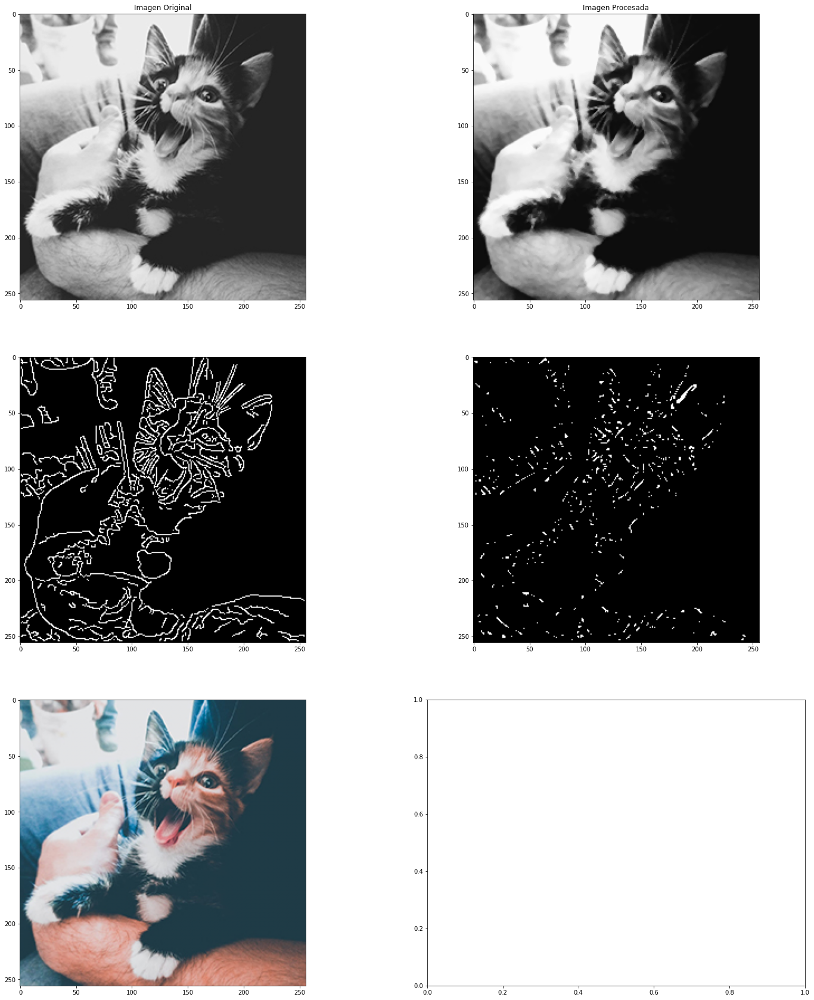

In [ ]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_mediana(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_mediana(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_mediana(img_rgb,se))

## Operaciones de suma/resta entre erosión y dilatación

### Borde externo

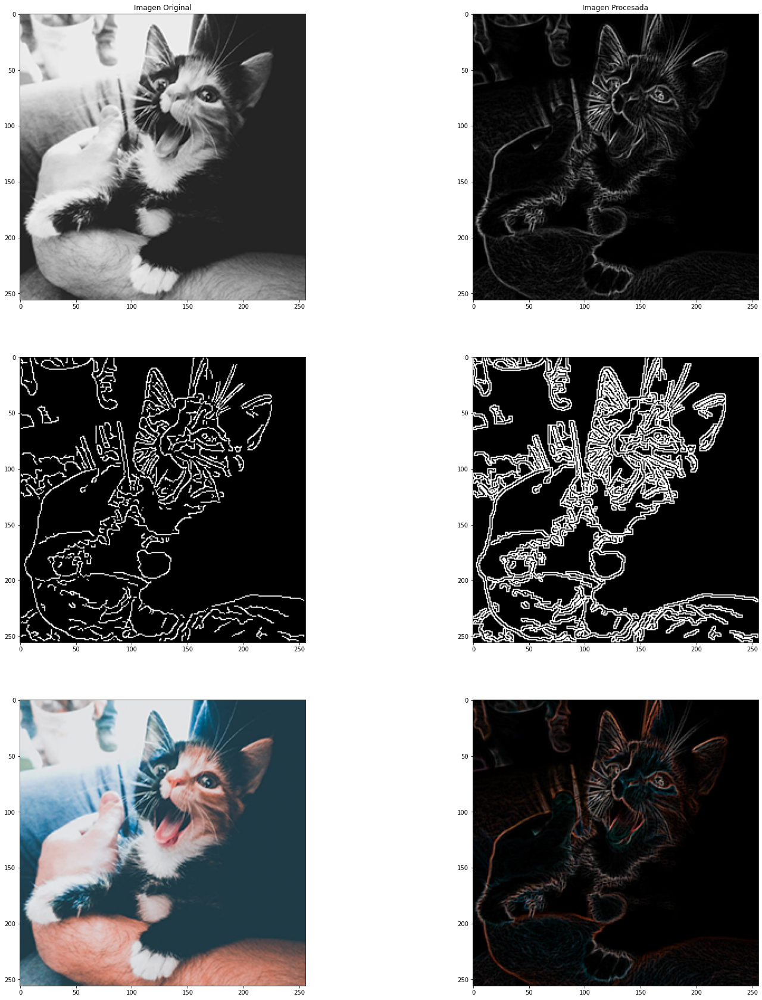

In [30]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_borde_externo(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_borde_externo(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_borde_externo(img_rgb,se))

### Borde interno

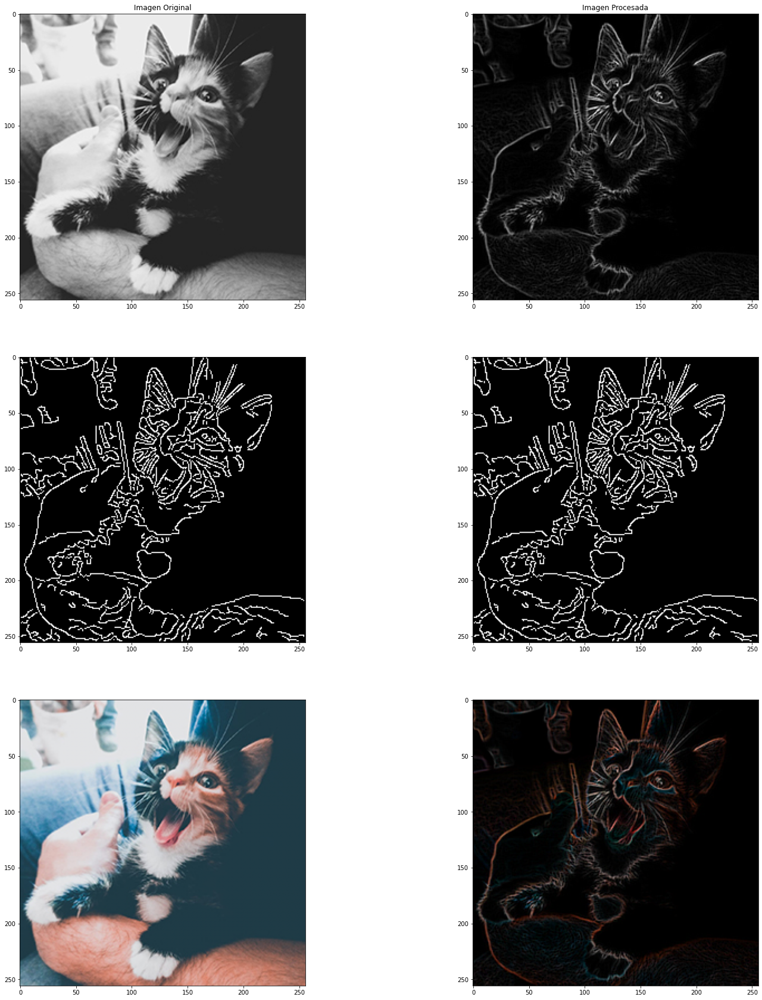

In [31]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_borde_interno(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_borde_interno(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_borde_interno(img_rgb,se))

### Gradiente

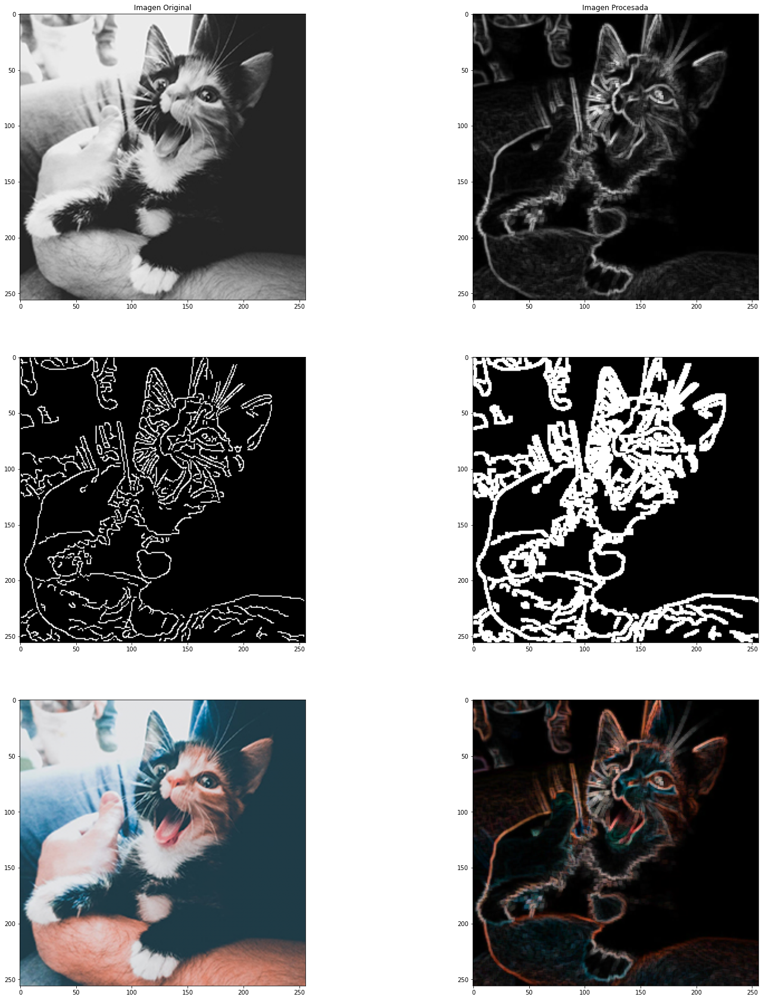

In [32]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_gradiente(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_gradiente(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_gradiente(img_rgb,se))

## Operaciones concatenando dilatación y erosión

### Apertura

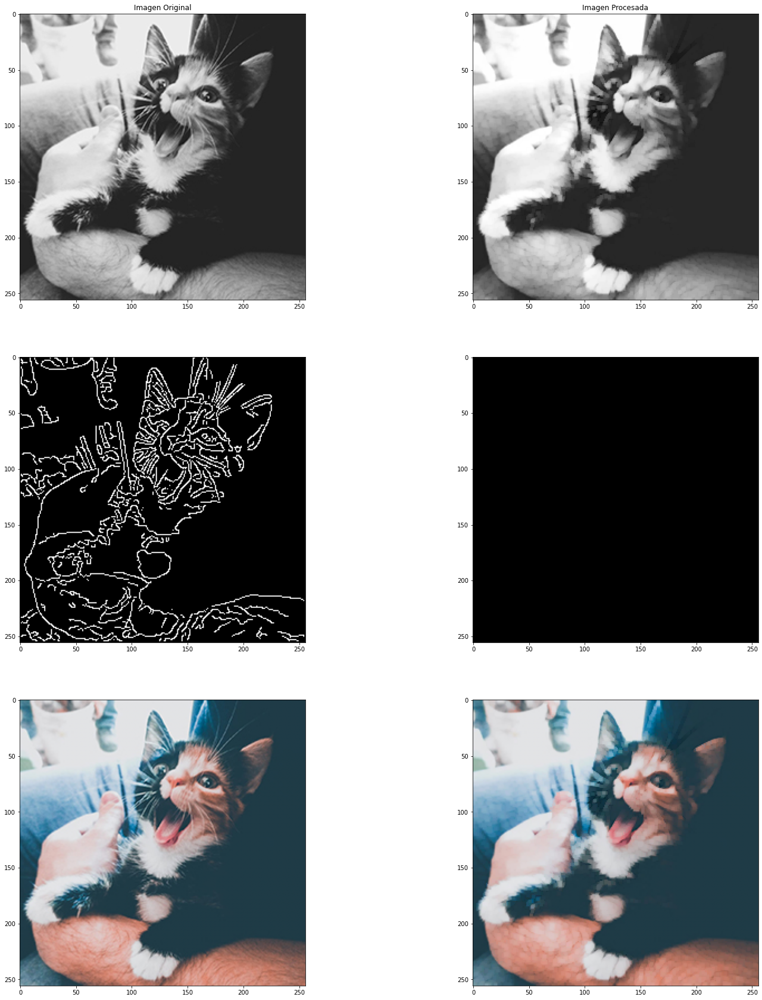

In [33]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_apertura(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_apertura(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_apertura(img_rgb,se))

### Cierre

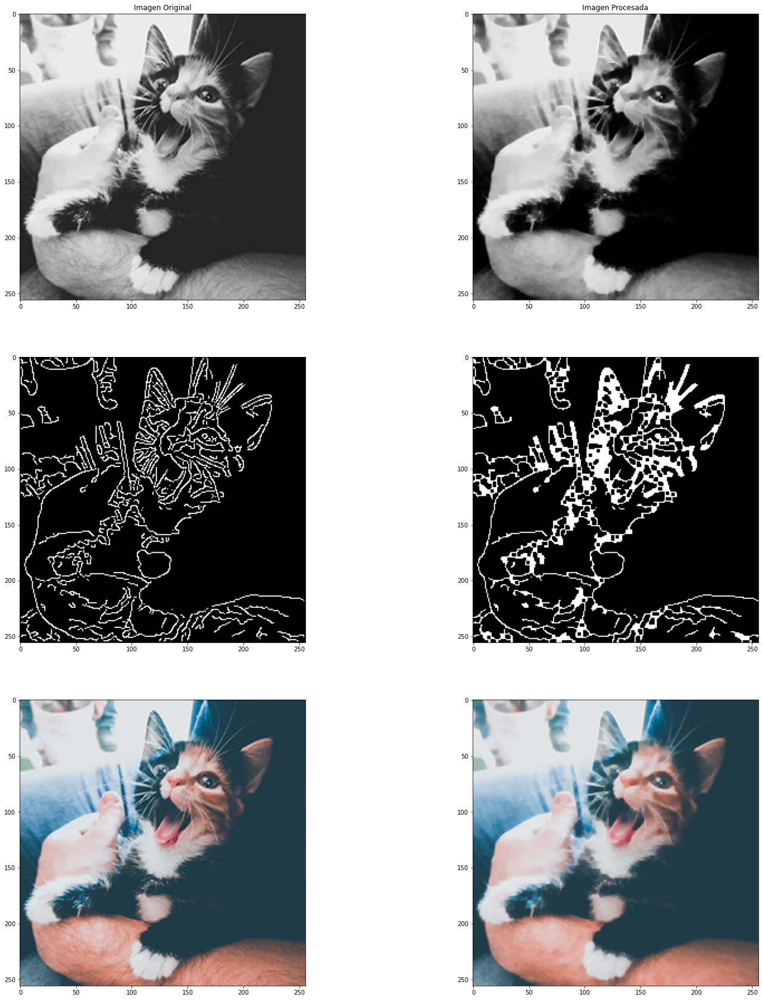

In [34]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_cierre(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_cierre(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_cierre(img_rgb,se))

### Top-hat

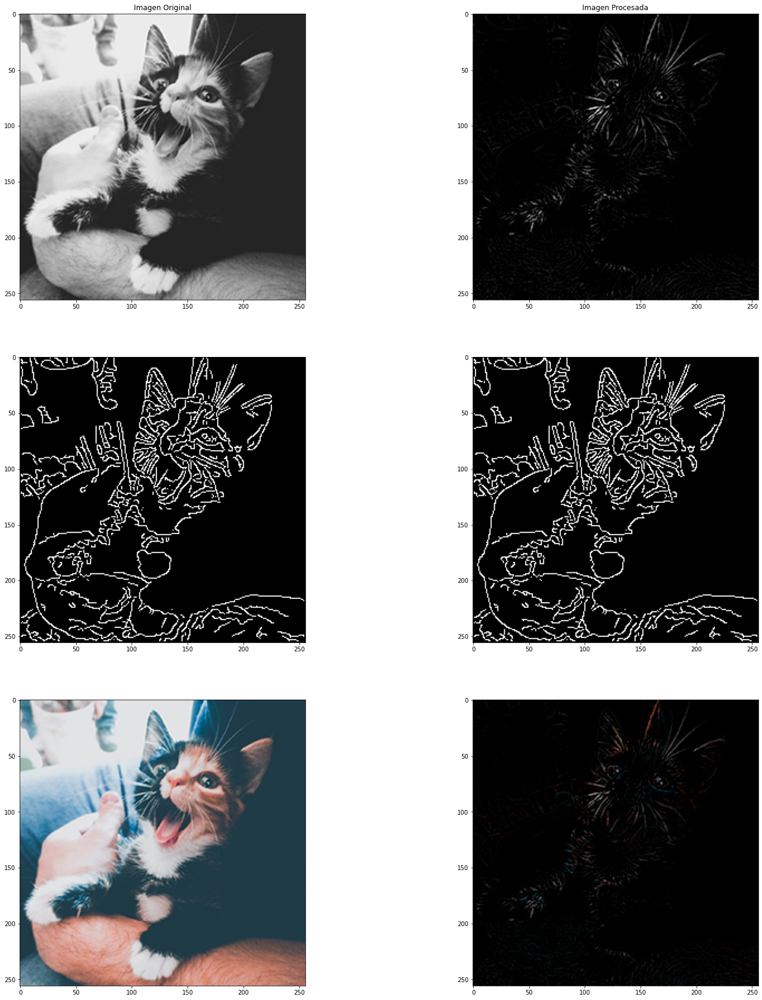

In [35]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_tophat(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_tophat(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_tophat(img_rgb,se))

### Bottom-hat

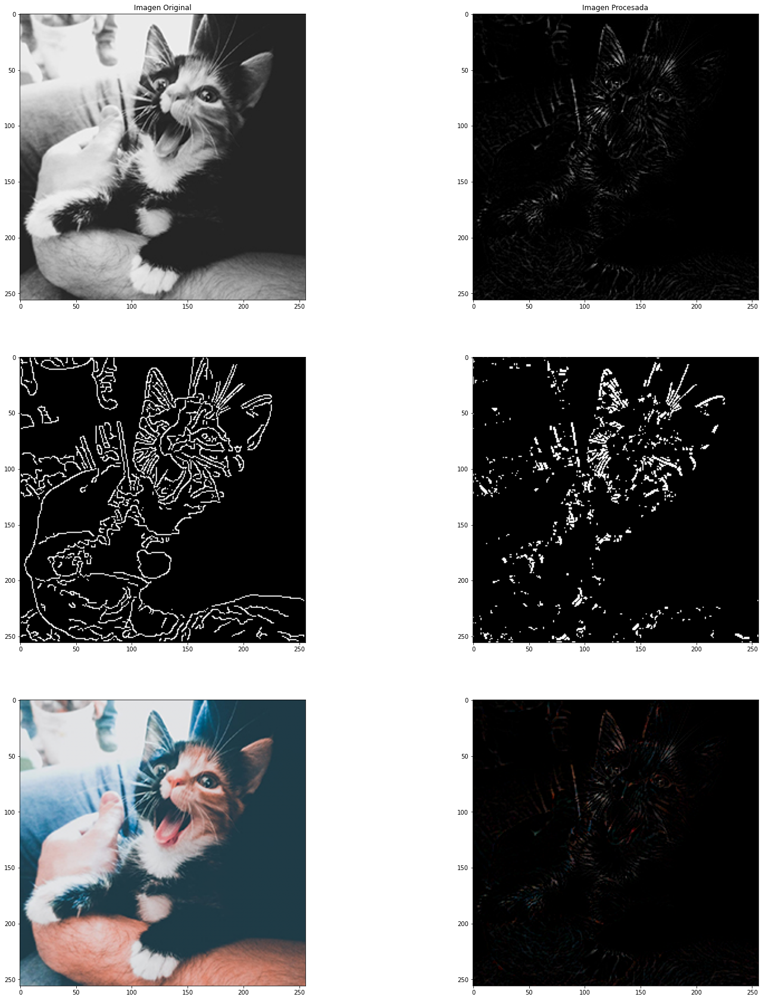

In [36]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_bottomhat(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_bottomhat(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_bottomhat(img_rgb,se))

## Operaciones concatenando cierre y apertura

### OC

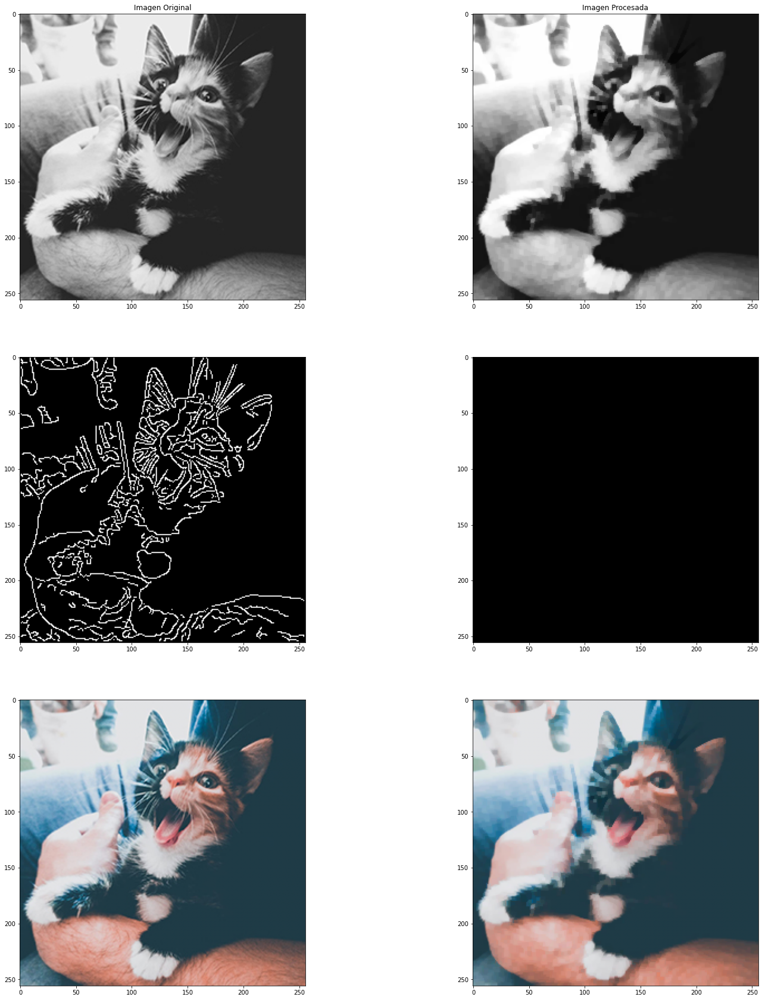

In [37]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_oc(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_oc(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_oc(img_rgb,se))

### CO

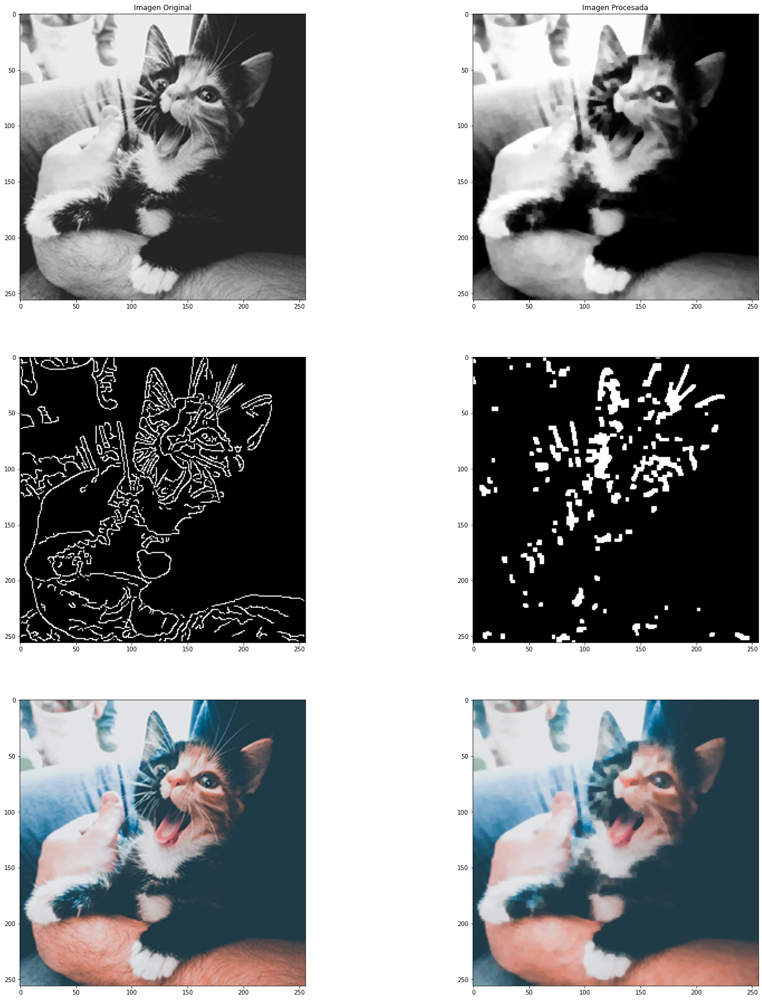

In [38]:
se = se_box

fig, axes = plt.subplots(3, 2, figsize=(25,30))
axes[0,0].set_title('Imagen Original')
axes[0,1].set_title('Imagen Procesada')
axes[0,0].imshow(img_gray, 'gray')
axes[0,1].imshow(im_co(img_gray,se), 'gray')
axes[1,0].imshow(img_bin, 'gray')
axes[1,1].imshow(im_co(img_bin,se), 'gray')
axes[2,0].imshow(img_rgb)
axes[2,1].imshow(im_co(img_rgb,se))

# Practica extra

## Segmentacion del iris del ojo

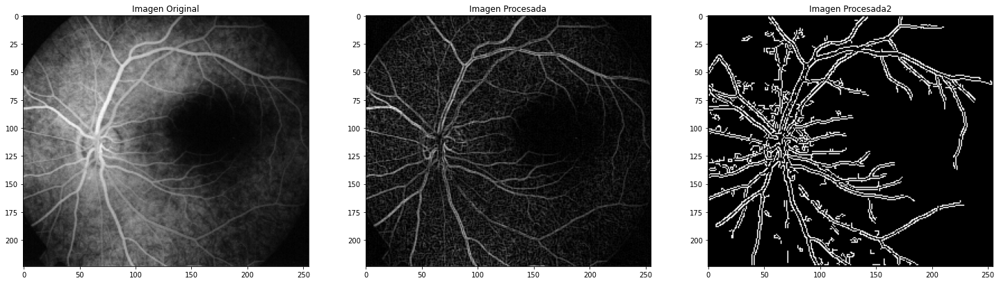

In [41]:
#Cargo imagen
img_iris = imageio.imread('/content/PDI/iris.bmp')/255

x1 = im_borde_interno(img_iris, se)
x2 = canny(x1, sigma = 0.55)


se = se_box

fig, axes = plt.subplots(1, 3, figsize=(25,30))
axes[0].set_title('Imagen Original')
axes[1].set_title('Imagen Procesada')
axes[2].set_title('Imagen Procesada2')


axes[0].imshow(img_iris, 'gray')
axes[1].imshow(x1, 'gray')
axes[2].imshow(x2, 'gray')




## Extracción de texto

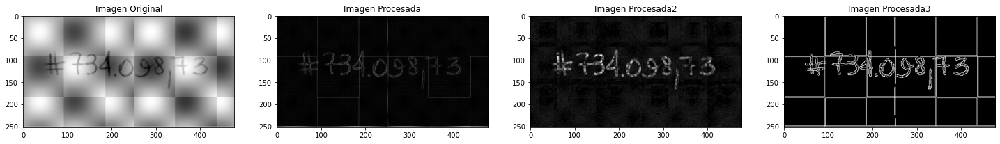

In [64]:
#Cargo imagen
img_text = imageio.imread('/content/PDI/text.png')/255

x1 = im_borde_externo(img_text , se)
x2 = im_apertura(x1, se)
x3 = canny(x1, sigma = 0.5)
#x3 = im_dilate(x3 , se)
#
x4 = im_tophat(x3, se)


se = se_box

fig, axes = plt.subplots(1, 4, figsize=(25,30))
axes[0].set_title('Imagen Original')
axes[1].set_title('Imagen Procesada')
axes[2].set_title('Imagen Procesada2')
axes[3].set_title('Imagen Procesada3')

axes[0].imshow(img_text , 'gray')
axes[1].imshow(x1, 'gray')
axes[2].imshow(x2, 'gray')
axes[3].imshow(x3, 'gray')